# Import the Required libraries 


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

C:\Users\kanth\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


# Load the Dataset

In [2]:
data = pd.read_csv('diabetes_prediction_dataset.csv')

print(data)

       gender   age  hypertension  heart_disease smoking_history    bmi  \
0      Female  80.0             0              1           never  25.19   
1      Female  54.0             0              0         No Info  27.32   
2        Male  28.0             0              0           never  27.32   
3      Female  36.0             0              0         current  23.45   
4        Male  76.0             1              1         current  20.14   
...       ...   ...           ...            ...             ...    ...   
99995  Female  80.0             0              0         No Info  27.32   
99996  Female   2.0             0              0         No Info  17.37   
99997    Male  66.0             0              0          former  27.83   
99998  Female  24.0             0              0           never  35.42   
99999  Female  57.0             0              0         current  22.43   

       HbA1c_level  blood_glucose_level  diabetes  
0              6.6                  140        

# Exploratory Data Analysis

In [3]:
data.head()

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.0,0,1,never,25.19,6.6,140,0
1,Female,54.0,0,0,No Info,27.32,6.6,80,0
2,Male,28.0,0,0,never,27.32,5.7,158,0
3,Female,36.0,0,0,current,23.45,5.0,155,0
4,Male,76.0,1,1,current,20.14,4.8,155,0


In [4]:
data.tail()

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
99995,Female,80.0,0,0,No Info,27.32,6.2,90,0
99996,Female,2.0,0,0,No Info,17.37,6.5,100,0
99997,Male,66.0,0,0,former,27.83,5.7,155,0
99998,Female,24.0,0,0,never,35.42,4.0,100,0
99999,Female,57.0,0,0,current,22.43,6.6,90,0


In [5]:
data.shape

(100000, 9)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   gender               100000 non-null  object 
 1   age                  100000 non-null  float64
 2   hypertension         100000 non-null  int64  
 3   heart_disease        100000 non-null  int64  
 4   smoking_history      100000 non-null  object 
 5   bmi                  100000 non-null  float64
 6   HbA1c_level          100000 non-null  float64
 7   blood_glucose_level  100000 non-null  int64  
 8   diabetes             100000 non-null  int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 6.9+ MB


# Data Preprocessing

In [7]:
data.isnull().sum()

gender                 0
age                    0
hypertension           0
heart_disease          0
smoking_history        0
bmi                    0
HbA1c_level            0
blood_glucose_level    0
diabetes               0
dtype: int64

No Null values were found in the Dataset

In [8]:
data = data.drop_duplicates()
duplicates_after = data.duplicated().sum()
print(f"Number of duplicated after removal: {duplicates_after}")

Number of duplicated after removal: 0


In [9]:
data.shape

(96146, 9)

# Descriptive Statistics

In [10]:
data.describe()

,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes
count,96146.000000,96146.000000,96146.000000,96146.000000,96146.000000,96146.000000,96146.000000
mean,41.794326,0.077601,0.040803,27.321461,5.532609,138.218231,0.088220
std,22.462948,0.267544,0.197833,6.767716,1.073232,40.909771,0.283616
min,0.080000,0.000000,0.000000,10.010000,3.500000,80.000000,0.000000
25%,24.000000,0.000000,0.000000,23.400000,4.800000,100.000000,0.000000
50%,43.000000,0.000000,0.000000,27.320000,5.800000,140.000000,0.000000
75%,59.000000,0.000000,0.000000,29.860000,6.200000,159.000000,0.000000
max,80.000000,1.000000,1.000000,95.690000,9.000000,300.000000,1.000000


In [11]:
# Convert categorical columns to numeric
data['gender'] = data['gender'].astype('category').cat.codes
data['smoking_history'] = data['smoking_history'].astype('category').cat.codes


In [12]:
data.head()

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0,80.0,0,1,4,25.19,6.6,140,0
1,0,54.0,0,0,0,27.32,6.6,80,0
2,1,28.0,0,0,4,27.32,5.7,158,0
3,0,36.0,0,0,1,23.45,5.0,155,0
4,1,76.0,1,1,1,20.14,4.8,155,0


# Identifying Outliers by Using Boxplots

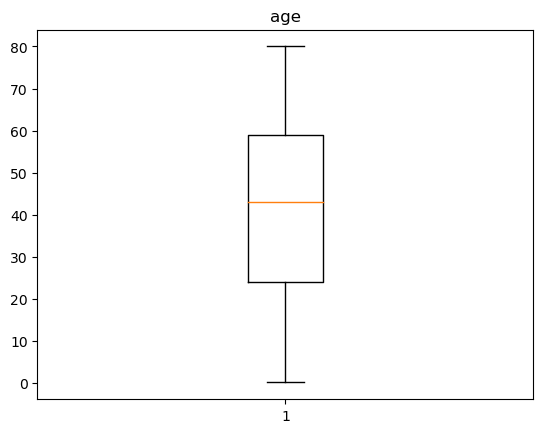

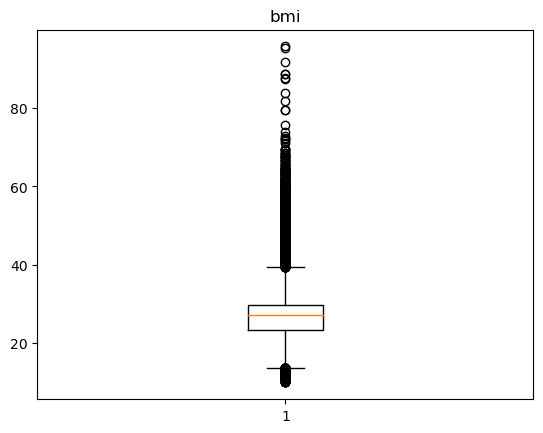

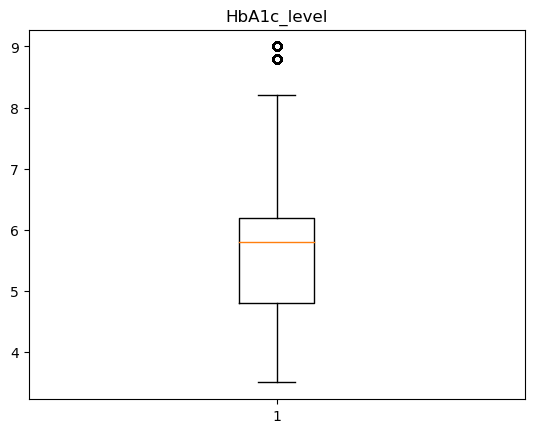

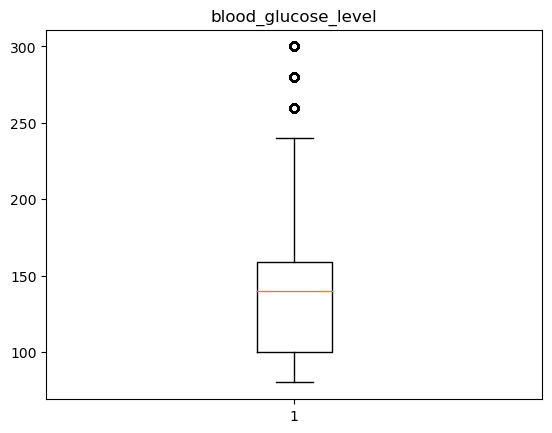

In [13]:

import matplotlib.pyplot as plt

numerical_columns = ['age', 'bmi', 'HbA1c_level', 'blood_glucose_level']
for column in numerical_columns:
    plt.boxplot(x=data[column])
    plt.title(column)
    plt.show()


The box plots are showing potential outliers in BMI column and a few outliers in the blood_glucose_level ,HbA1c column

# Outliers Detection By IQR

In [14]:
numerical_columns = ['age','bmi','HbA1c_level','blood_glucose_level']
for column in numerical_columns:
    print(column, ":")
    q1 = data[column].quantile(0.25)
    q3 = data[column].quantile(0.75)
    iqr = q3-q1
    upper_tail = q3+1.5*iqr
    lower_tail = q1-1.5*iqr
    
    print("q1 --->", q1)
    print("q3 --->", q3)
    print("iqr --->",iqr)
    print("uppertail --->", upper_tail)
    print("lowertail --->", lower_tail)
    print("_"*50)

age :
q1 ---> 24.0
q3 ---> 59.0
iqr ---> 35.0
uppertail ---> 111.5
lowertail ---> -28.5
__________________________________________________
bmi :
q1 ---> 23.4
q3 ---> 29.86
iqr ---> 6.460000000000001
uppertail ---> 39.55
lowertail ---> 13.709999999999997
__________________________________________________
HbA1c_level :
q1 ---> 4.8
q3 ---> 6.2
iqr ---> 1.4000000000000004
uppertail ---> 8.3
lowertail ---> 2.6999999999999993
__________________________________________________
blood_glucose_level :
q1 ---> 100.0
q3 ---> 159.0
iqr ---> 59.0
uppertail ---> 247.5
lowertail ---> 11.5
__________________________________________________


Using the Interquartile Range (IQR) method, any values exceeding the upper or lower tails are identified as outliers.
This analysis confirms potential outliers in BMI column of the dataset.

Rather than removing outliers and potentially losing valuable insights, a more effective approach is data transformation.
Techniques like checking and adjusting for skewness can help in understanding and mitigating the impact of these outliers,
preserving the integrity of the dataset.



# Checking Skewness

Skewness can help you understand the nature of your data distribution

In [15]:
from scipy.stats import skew

In [16]:
skew_columns = ['age','bmi','HbA1c_level','blood_glucose_level']

for num_column in skew_columns:
    print(num_column,"---->" ,skew (data[num_column]))  

age ----> -0.06244376183924185
bmi ----> 1.0237351938325256
HbA1c_level ----> -0.05446239424685854
blood_glucose_level ----> 0.8364762101963947


The skewness values provide insights into the distribution of your data. 

Age (-0.062): This value is close to 0, indicating that the age distribution is approximately symmetrical.

BMI (1.024): This positive skewness indicates that the BMI data is skewed to the right, meaning there are more values on the lower side, with a few high BMI values pulling the mean up.

HbA1c Level (-0.054): Like age, this value is close to 0, suggesting that the HbA1c level distribution is fairly symmetrical.

Blood Glucose Level (0.836): This positive skewness indicates that the blood glucose level data is also skewed to the right, similar to BMI.

# Visualizations for Skewness

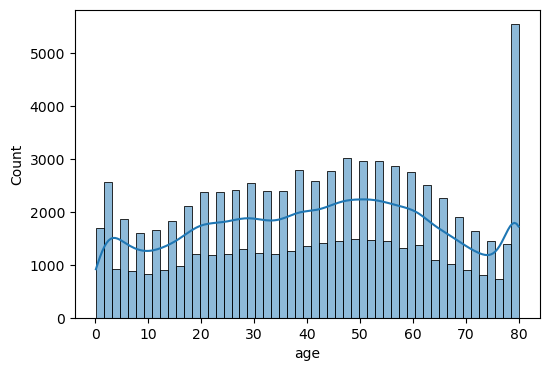

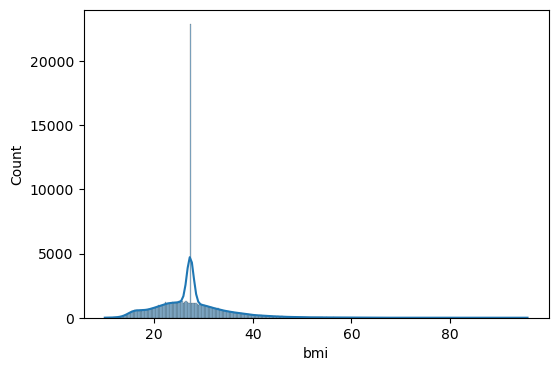

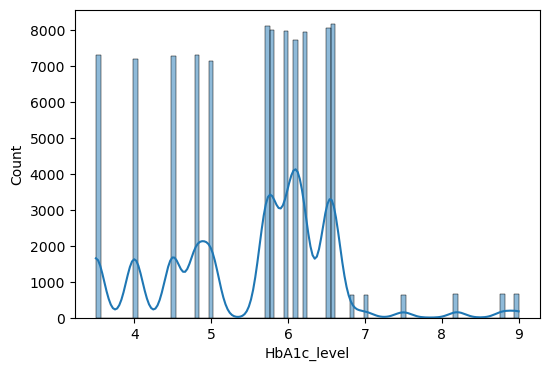

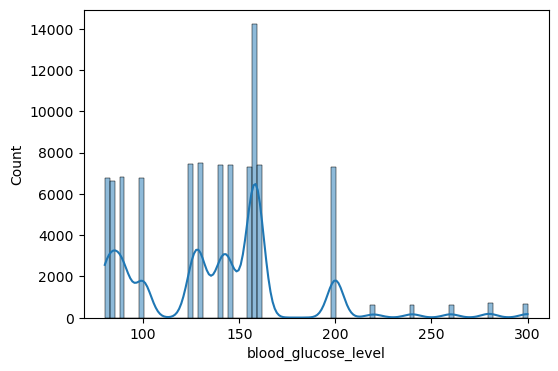

In [17]:
for num_column in skew_columns:
    plt.figure(figsize=(6,4))
    sns.histplot(data[num_column],kde = True)
    plt.show()

If the skewness is:

Close to 0: The data is fairly symmetrical.

Greater than 0: The data is positively skewed (tail on the right).

Less than 0: The data is negatively skewed (tail on the left).

# Handling Skewness

As the age and HbA1c columns are symmetrical, handling skewness for the BMI and blood glucose level columns by applying
a square root transformation.

In [18]:
num_columns = ['bmi', 'blood_glucose_level']
skew_columns = ['bmi', 'blood_glucose_level']



for column in num_columns:
    data[column] = np.sqrt(data[column])


for column in skew_columns:
    print(column, "--->", skew(data[column]))


bmi ---> 0.4151219086708789
blood_glucose_level ---> 0.31613919939282686


The skewness values for BMI (0.415) and blood glucose level (0.316) have significantly improved after applying the square root 
transformation and theses values are now much closer to 0, indicating a more symmetrical distribution and reduced skewness.


In [19]:
data.head()

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0,80.0,0,1,4,5.018964,6.6,11.832160,0
1,0,54.0,0,0,0,5.226854,6.6,8.944272,0
2,1,28.0,0,0,4,5.226854,5.7,12.569805,0
3,0,36.0,0,0,1,4.842520,5.0,12.449900,0
4,1,76.0,1,1,1,4.487761,4.8,12.449900,0


# Visualizations after SQRT transformation

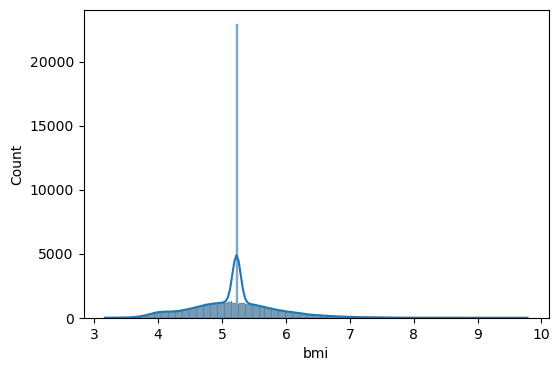

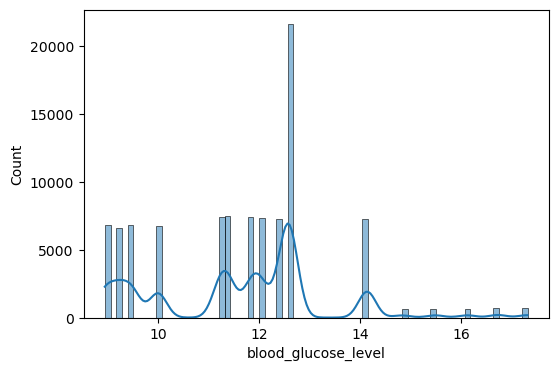

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

skew_columns = ['bmi', 'blood_glucose_level']

for column in skew_columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(data[column], kde=True)
    plt.show()


# Correlation Matrix

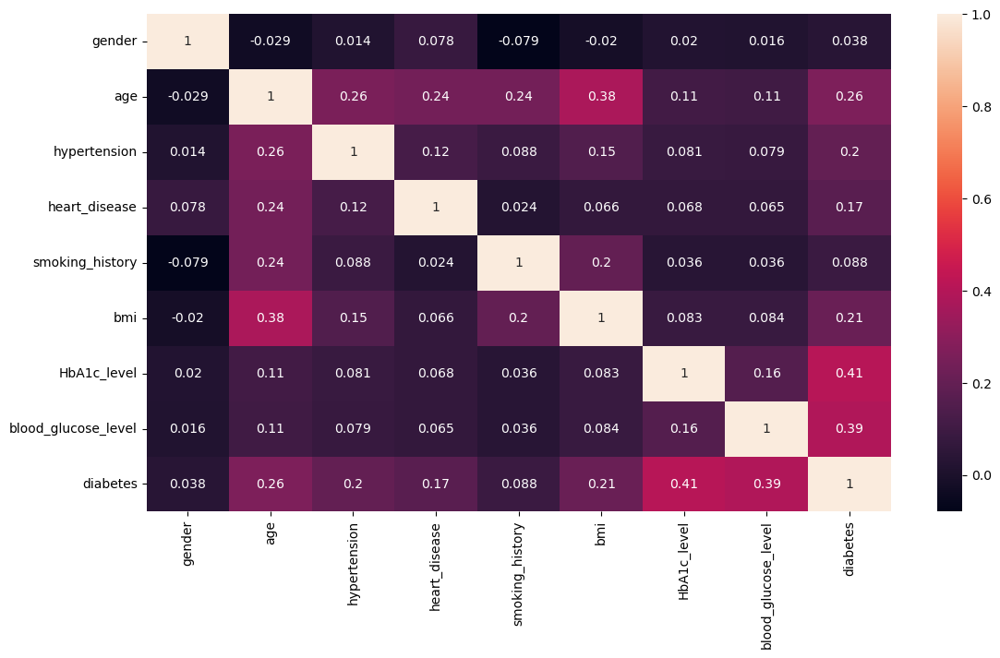

In [21]:
plt.figure(figsize=(13,7))
sns.heatmap(data.corr(), annot=True)
plt.show()

The correlation matrix helps to understand the relationship between the different factors 
such as age,bmi,smoking_history,blood glucose levels, gender,hypertension with diabeties
Here in the data variables like glucose levels,bmi,age and hba1c levels are showing strong positive correlation 


# Proportion of Diabetic and Non-Diabetic Individuals

In [22]:
data.columns

Index(['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history',
       'bmi', 'HbA1c_level', 'blood_glucose_level', 'diabetes'],
      dtype='object')

In [23]:
diabetic_counts = data['diabetes'].value_counts()
diabetic_counts 

diabetes
0    87664
1     8482
Name: count, dtype: int64

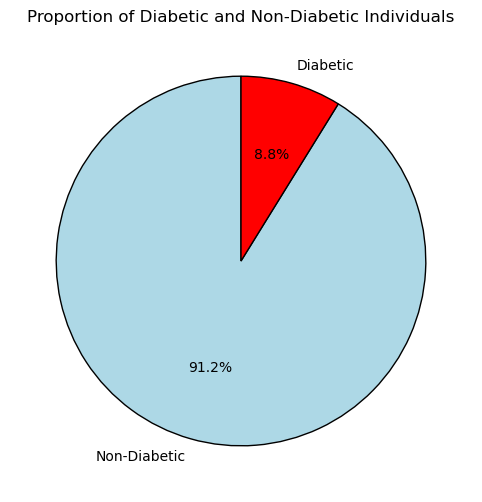

In [24]:
plt.figure(figsize=(8, 6))
labels = ['Non-Diabetic', 'Diabetic']
plt.pie(diabetic_counts, labels=labels, autopct='%.1f%%', startangle=90, colors=['lightblue', 'red'], wedgeprops={'edgecolor': 'black'})
plt.title('Proportion of Diabetic and Non-Diabetic Individuals')
plt.show()


The pie chart represents the proportion of diabetic and non-diabetic individuals in this dataset, 
The larger light blue represents non-diabetic upto 91.2% and diabetic individuals are 8.8% of the total population.

# Count of Males and Females in  the Dataset

In [25]:
data.columns

Index(['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history',
       'bmi', 'HbA1c_level', 'blood_glucose_level', 'diabetes'],
      dtype='object')

In [26]:
gender_counts = data['gender'].value_counts()
print(gender_counts)


gender
0    56161
1    39967
2       18
Name: count, dtype: int64


In [27]:
data

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0,80.0,0,1,4,5.018964,6.6,11.832160,0
1,0,54.0,0,0,0,5.226854,6.6,8.944272,0
2,1,28.0,0,0,4,5.226854,5.7,12.569805,0
3,0,36.0,0,0,1,4.842520,5.0,12.449900,0
4,1,76.0,1,1,1,4.487761,4.8,12.449900,0
...,...,...,...,...,...,...,...,...,...
99994,0,36.0,0,0,0,4.959839,4.8,12.041595,0
99996,0,2.0,0,0,0,4.167733,6.5,10.000000,0
99997,1,66.0,0,0,3,5.275415,5.7,12.449900,0
99998,0,24.0,0,0,4,5.951470,4.0,10.000000,0


In [28]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


C:\Users\kanth\AppData\Local\Temp\ipykernel_16984\1431858401.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='gender', data=data, palette='pastel')


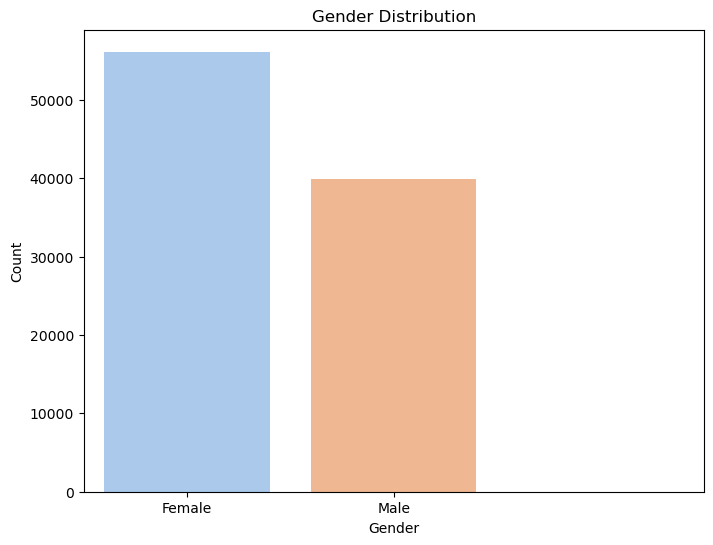

In [29]:
# Convert gender to integer type
data['gender'] = data['gender'].astype(int)




plt.figure(figsize=(8, 6))
sns.countplot(x='gender', data=data, palette='pastel')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.xticks([0, 1], ['Female', 'Male'])
plt.title('Gender Distribution')
plt.show()


From the count plot it's clear that more number of peoples are female and less are male.

# Gender Distribution According to The Target Variable

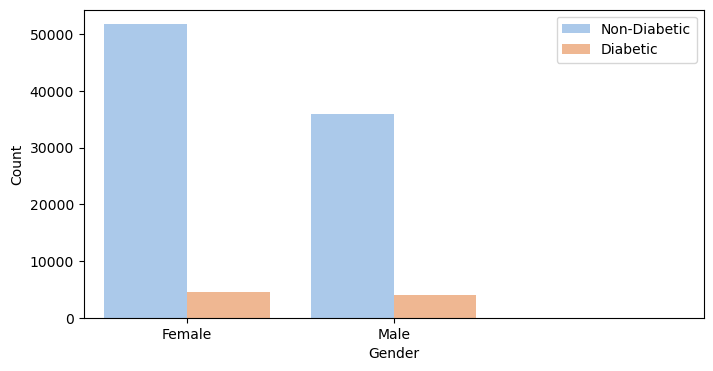

In [30]:
plt.figure(figsize=(8,4))
sns.countplot(x='gender', hue = 'diabetes', data=data, palette='pastel')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend(labels=['Non-Diabetic','Diabetic'])
plt.xticks([0,1],['Female','Male'])
plt.show()

From the count plot, there are more female for diabetic then men.

In [31]:
data.columns

Index(['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history',
       'bmi', 'HbA1c_level', 'blood_glucose_level', 'diabetes'],
      dtype='object')

In [32]:
data

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0,80.0,0,1,4,5.018964,6.6,11.832160,0
1,0,54.0,0,0,0,5.226854,6.6,8.944272,0
2,1,28.0,0,0,4,5.226854,5.7,12.569805,0
3,0,36.0,0,0,1,4.842520,5.0,12.449900,0
4,1,76.0,1,1,1,4.487761,4.8,12.449900,0
...,...,...,...,...,...,...,...,...,...
99994,0,36.0,0,0,0,4.959839,4.8,12.041595,0
99996,0,2.0,0,0,0,4.167733,6.5,10.000000,0
99997,1,66.0,0,0,3,5.275415,5.7,12.449900,0
99998,0,24.0,0,0,4,5.951470,4.0,10.000000,0


# Smoking History and Diabeties Distribution

In [33]:
Smoking_history = data['smoking_history'].value_counts() 
labels = ([0,1,2,3,4,5],['No Info','current','ever','former','never','not current'])
print(Smoking_history)

smoking_history
4    34398
0    32887
3     9299
1     9197
5     6367
2     3998
Name: count, dtype: int64


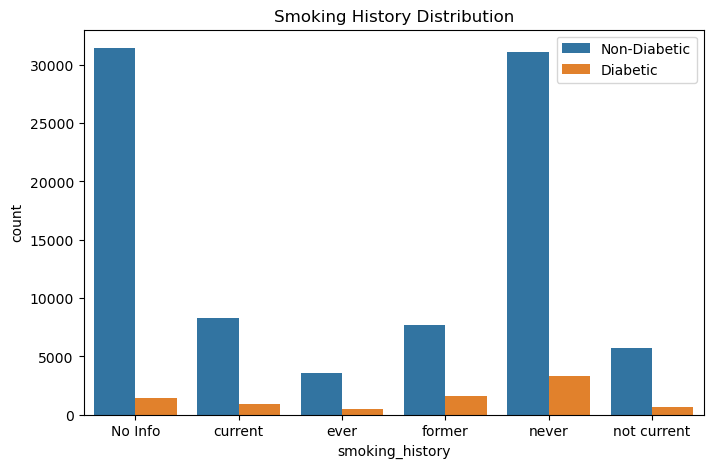

In [34]:
data['smoking_history'] = data['smoking_history'].astype(int)
plt.figure(figsize=(8, 5))
sns.countplot(data=data,hue='diabetes', x='smoking_history')
plt.xticks([0,1,2,3,4,5],['No Info','current','ever','former','never','not current'])
plt.legend(labels=['Non-Diabetic','Diabetic'])
plt.title("Smoking History Distribution")
plt.show()

The bar chart displays the distibution of smoking history,
the category of never has the highest diabetic individuals follwed by category of former.
The category of no info and current has the little less count with diabetic compare to never.
and more with non diabetic individuals in never,no-info

# Mean BMI Comparison by Diabetes Status

In [35]:
#Group the data by diabetes status and calculate the mean BMI for each group:

mean_bmi = data.groupby('diabetes')['bmi'].mean().reset_index()

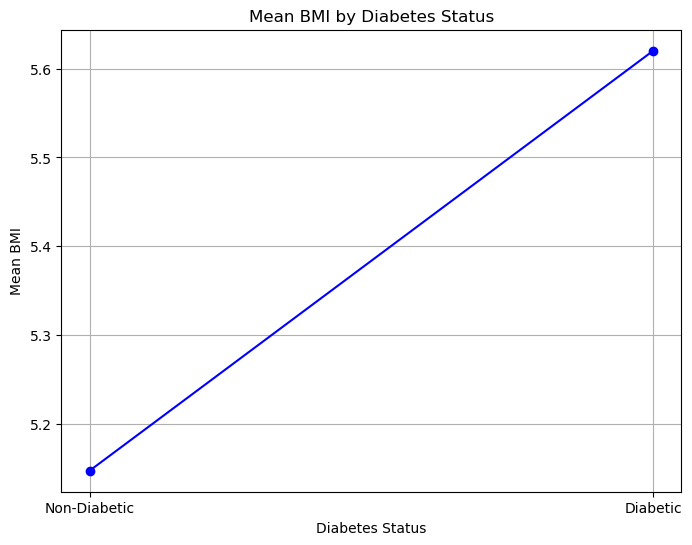

In [36]:
plt.figure(figsize=(8, 6))
plt.plot(mean_bmi['diabetes'], mean_bmi['bmi'], marker='o', linestyle='-', color='b')
plt.xlabel('Diabetes Status')
plt.ylabel('Mean BMI')
plt.title('Mean BMI by Diabetes Status')
plt.xticks([0, 1], ['Non-Diabetic', 'Diabetic'])
plt.grid(True)
plt.show()

The graph highlights that, the individuals with diabetes have a higher BMI compared to those Non diabetic. 

# Relationship between Age, BMI, and Diabetes Status

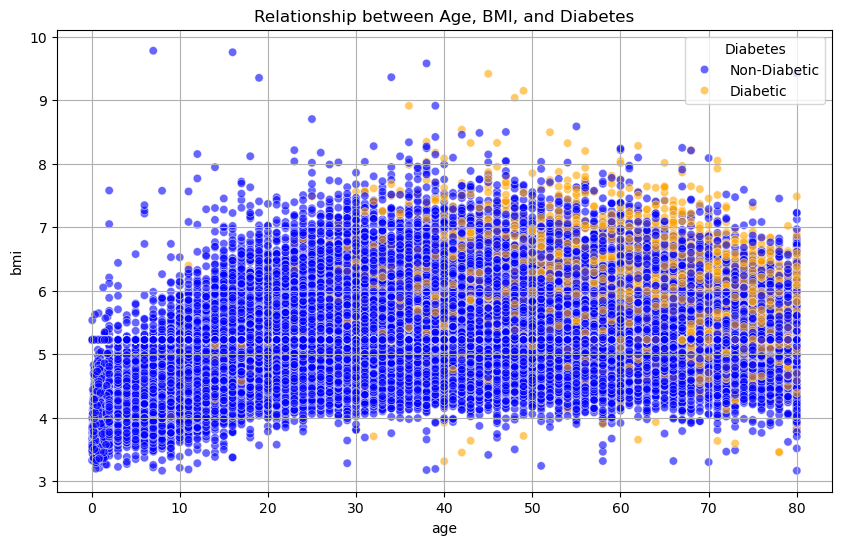

In [37]:
plt.figure(figsize=(10, 6))

scatter = sns.scatterplot(data=data, x='age', y='bmi', hue='diabetes',palette={0: 'blue', 1: 'orange'}, alpha=0.6)
plt.xlabel('age')
plt.ylabel('bmi')

plt.title('Relationship between Age, BMI, and Diabetes')
handles, labels = scatter.get_legend_handles_labels()
plt.legend(handles=handles, labels=['Non-Diabetic', 'Diabetic'], title='Diabetes')
plt.grid(True)
plt.show()


The scatter plot shows the distribution of BMI across different ages for both diabetic and non diabetic individuals
The Orange dots are more concentrated in the higher BMI range, indicating that higher BMI is asssociated with diabetes
and the Blue dots are non diabetic are more spraed out across the BMI range
In a conclusion, the individuals with higher BMI are more likely to be diabetic, as increase in age.

In [39]:
import pandas as pd
import plotly.express as px


In [40]:
fig = px.scatter(
    data, 
    x='age', 
    y='bmi', 
    color='diabetes', 
    color_discrete_map={0: 'blue', 1: 'orange'}, 
    title='Relationship between Age, BMI, and Diabetes',
    labels={'age': 'Age', 'bmi': 'BMI', 'diabetes': 'Diabetes Status'},
    opacity=0.6
)

fig.update_layout(
    legend_title_text='Diabetes',
    xaxis=dict(title='Age'),
    yaxis=dict(title='BMI')
)

fig.show()


The interactive visualization by using Plotly, which is easy to explain the data insights derived from the analysis.

# Hypertension Distribution

In [41]:
data.columns

Index(['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history',
       'bmi', 'HbA1c_level', 'blood_glucose_level', 'diabetes'],
      dtype='object')

In [42]:
hypertension_counts = data['hypertension'].value_counts()
print(hypertension_counts)

hypertension
0    88685
1     7461
Name: count, dtype: int64


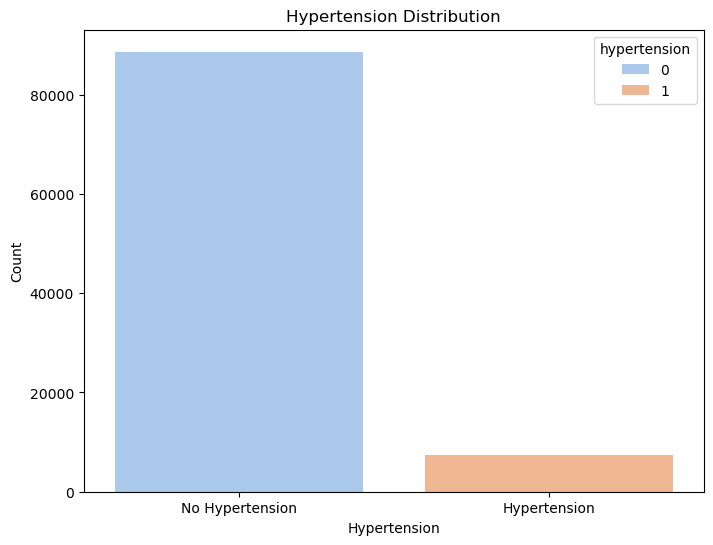

In [43]:
plt.figure(figsize=(8, 6))
sns.countplot(x='hypertension', hue='hypertension', data=data, palette='pastel', dodge=False)


plt.title('Hypertension Distribution')
plt.xlabel('Hypertension')
plt.ylabel('Count')
plt.xticks([0, 1], ['No Hypertension', 'Hypertension'])
plt.show()



# Hypertension Distribution with Diabetes Status

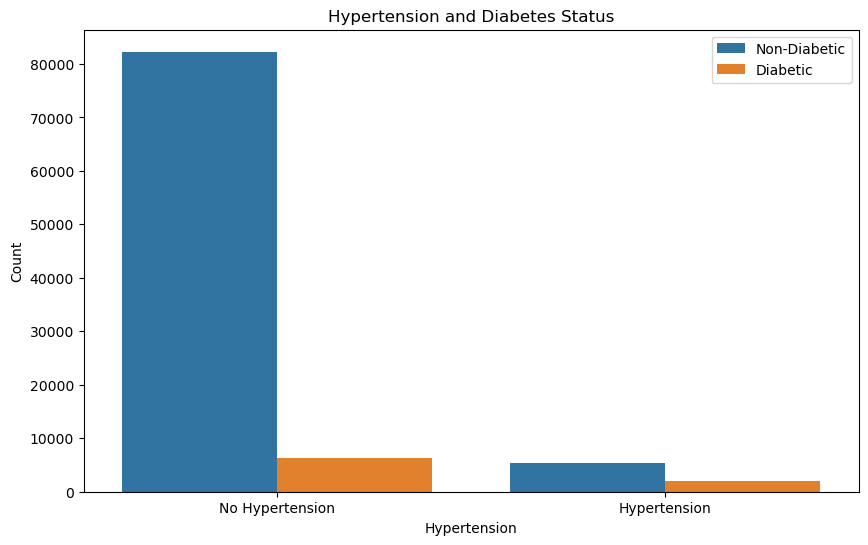

In [44]:
plt.figure(figsize=(10, 6))
sns.countplot(x='hypertension', hue='diabetes', data=data)
plt.legend(labels=['Non-Diabetic', 'Diabetic'])
plt.title('Hypertension and Diabetes Status')
plt.xlabel('Hypertension')
plt.ylabel('Count')
plt.xticks([0, 1], ['No Hypertension', 'Hypertension'])
plt.show()

From the bar chart the majority of non-diabetic individuals do not have hypertension 
and a smaller portion of non diabetic individuals have hypertension
and also the noticeable count of diabetic individuals are without hypertension 



# Distribution of Blood glucose levels by Diabetes Status

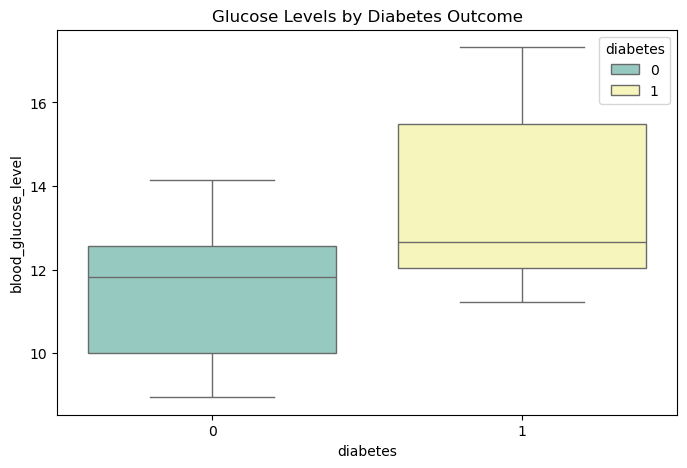

In [45]:
plt.figure(figsize=(8, 5))
sns.boxplot(x='diabetes', y='blood_glucose_level',hue='diabetes', data=data,palette = "Set3")
plt.title('Glucose Levels by Diabetes Outcome')
plt.show()

This box plot highlights the difference in blood glucose levels between individuals with and without diabetes. 
Diabetic individuals tend to have higher blood glucose levels compared to non-diabetic individuals.

# Distribution of HbA1c levels by Diabetes Status

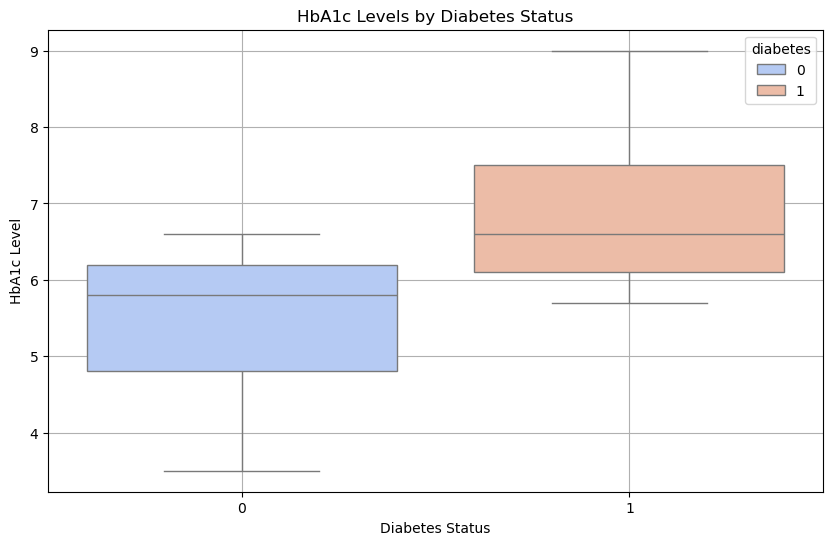

In [46]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='diabetes', y='HbA1c_level', data=data,hue= 'diabetes', palette='coolwarm')
plt.xlabel('Diabetes Status')
plt.ylabel('HbA1c Level')
plt.title('HbA1c Levels by Diabetes Status')
plt.grid(True)

plt.show()

This box plot highlights the difference in HbA1c levels between non-diabetic and diabetic individuals. 
Diabetic individuals tend to have higher HbA1c levels compared to non-diabetic individuals. 
The median HbA1c level for diabetic individuals is significantly higher, and the range of HbA1c levels is also broader.

# Data Modelling

For data modeling, i have selected logistic regression as the target variable "diabetes" represents a binary classification
with two possible outcomes: diabetic (1) or non-diabetic (0).

# Logistic Regression

In [47]:

x = data.drop(columns=['diabetes'])  
y = data['diabetes'] 

In [48]:
x


,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level
0,0,80.0,0,1,4,5.018964,6.6,11.832160
1,0,54.0,0,0,0,5.226854,6.6,8.944272
2,1,28.0,0,0,4,5.226854,5.7,12.569805
3,0,36.0,0,0,1,4.842520,5.0,12.449900
4,1,76.0,1,1,1,4.487761,4.8,12.449900
...,...,...,...,...,...,...,...,...
99994,0,36.0,0,0,0,4.959839,4.8,12.041595
99996,0,2.0,0,0,0,4.167733,6.5,10.000000
99997,1,66.0,0,0,3,5.275415,5.7,12.449900
99998,0,24.0,0,0,4,5.951470,4.0,10.000000


In [49]:
y

0        0
1        0
2        0
3        0
4        0
        ..
99994    0
99996    0
99997    0
99998    0
99999    0
Name: diabetes, Length: 96146, dtype: int64

In [50]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.api import OLS, add_constant
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.model_selection import train_test_split


In [51]:
y.value_counts()

diabetes
0    87664
1     8482
Name: count, dtype: int64

In [52]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25, random_state = 42)

In [53]:
x_train

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level
5110,0,14.0,0,0,0,4.669047,3.5,11.224972
34185,1,21.0,0,0,4,6.640030,5.0,11.832160
31338,0,13.0,0,0,0,4.142463,6.5,11.224972
20618,0,25.0,0,0,0,5.226854,4.0,10.000000
4010,1,17.0,0,0,0,4.783304,4.0,12.569805
...,...,...,...,...,...,...,...,...
6284,0,12.0,0,0,0,4.534314,6.0,12.649111
56182,1,62.0,0,0,3,5.323533,5.7,12.649111
79353,0,56.0,1,0,4,5.217279,6.1,14.142136
860,0,37.0,0,0,4,4.995998,6.2,12.569805


In [54]:
LR = LogisticRegression()

In [55]:
LR.fit(x,y)

C:\Users\kanth\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [56]:
y_pred = LR.predict(x_test)

In [57]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.956317344094521

In [58]:
y_pred = LR.predict(x_train)

In [59]:
from sklearn.metrics import accuracy_score
accuracy_score(y_train,y_pred)

0.9580080156429849

# Confusion Matrix

In [60]:
from sklearn.metrics import confusion_matrix


y_pred = LR.predict(x_test)


conf_matrix_test = confusion_matrix(y_test, y_pred)


print(f'Confusion Matrix for Test Set:\n{conf_matrix_test}')



Confusion Matrix for Test Set:
[[21661   209]
 [  841  1326]]


True Negatives (TN): 21,646 (top-left) - Non-diabetic individuals correctly classified as non-diabetic.

False Positives (FP): 209 (top-right) - Non-diabetic individuals incorrectly classified as diabetic.

False Negatives (FN): 841 (bottom-left) - Diabetic individuals incorrectly classified as non-diabetic.

True Positives (TP): 1,326 (bottom-right) - Diabetic individuals correctly classified as diabetic.

# Model Performance Metrics

In [61]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1-score: {f1:.2f}')


Accuracy: 0.96
Precision: 0.86
Recall: 0.61
F1-score: 0.72


Accuracy (0.96): Indicates that 96% of the predictions made by the model are correct. This high value shows that the model is generally accurate.

Precision (0.86): Indicates that when the model predicts a positive case (diabetes), it is correct 86% of the time. This means that the model is quite good at avoiding false positives.

Recall (0.61): Indicates that the model correctly identifies 61% of the actual positive cases (diabetes). 

F1-score (0.72): This is the harmonic mean of precision and recall, and it balances the two metrics. A score of 0.72 indicates a good balance between precision and recall.

Overall, the model performs well, especially in terms of accuracy and precision. 

Notably, the recall was 61%, indicating a need for improvement. To enhance recall, i have tried another model Random Forest.

# Random Forest Classifier

In [62]:
!pip install scikit-learn


In [63]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix


In [64]:

X = data.drop('diabetes', axis=1)
y = data['diabetes']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [65]:
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

In [66]:
y_pred = rf_classifier.predict(X_test)


In [67]:
print("Classification Report:")
print(classification_report(y_test, y_pred))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.98     26267
           1       0.95      0.69      0.80      2577

    accuracy                           0.97     28844
   macro avg       0.96      0.84      0.89     28844
weighted avg       0.97      0.97      0.97     28844

Confusion Matrix:
[[26174    93]
 [  790  1787]]


The model performance was indicate an improvement in recall and overall performance compared to the logistic regression model

# XGBoost

In [ ]:
To further improve the model performance i have tried XGBoost Model

In [69]:
!pip install xgboost


In [70]:
import pandas as pd
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix


In [71]:


X = data.drop('diabetes', axis=1)
y = data['diabetes']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [72]:
xgb_classifier = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
xgb_classifier.fit(X_train, y_train)


C:\Users\kanth\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning:

[23:23:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

In [73]:
y_pred = xgb_classifier.predict(X_test)


In [74]:
print("Classification Report:")
print(classification_report(y_test, y_pred))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.98     26267
           1       0.96      0.70      0.81      2577

    accuracy                           0.97     28844
   macro avg       0.97      0.85      0.90     28844
weighted avg       0.97      0.97      0.97     28844

Confusion Matrix:
[[26198    69]
 [  773  1804]]


The XGBoost model has further improved performance, 
with a higher recall compared to the logistic regression and random forest models.

Conclusion: Utilising logistic and random forest and XGBoost models can effectively identify individuals who are at a risk of 
diabetes.

# Linear Regression Model

For linear regression, I have chosen HbA1c as the target variable because it is a continuous numerical value.

The remaining columns, such as age, BMI, hypertension, heart disease, smoking history, blood glucose levels, and diabetes 
will serve as predictors in the model. 




In [75]:
X = data.drop('HbA1c_level', axis=1)
y = data['HbA1c_level']

In [76]:
X

,gender,age,hypertension,heart_disease,smoking_history,bmi,blood_glucose_level,diabetes
0,0,80.0,0,1,4,5.018964,11.832160,0
1,0,54.0,0,0,0,5.226854,8.944272,0
2,1,28.0,0,0,4,5.226854,12.569805,0
3,0,36.0,0,0,1,4.842520,12.449900,0
4,1,76.0,1,1,1,4.487761,12.449900,0
...,...,...,...,...,...,...,...,...
99994,0,36.0,0,0,0,4.959839,12.041595,0
99996,0,2.0,0,0,0,4.167733,10.000000,0
99997,1,66.0,0,0,3,5.275415,12.449900,0
99998,0,24.0,0,0,4,5.951470,10.000000,0


In [77]:
y

0        6.6
1        6.6
2        5.7
3        5.0
4        4.8
        ... 
99994    4.8
99996    6.5
99997    5.7
99998    4.0
99999    6.6
Name: HbA1c_level, Length: 96146, dtype: float64

In [78]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.api import OLS, add_constant

model = OLS(y, X).fit()

model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:            HbA1c_level   R-squared (uncentered):                   0.962
Model:                            OLS   Adj. R-squared (uncentered):              0.962
Method:                 Least Squares   F-statistic:                          3.071e+05
Date:                Sat, 22 Feb 2025   Prob (F-statistic):                        0.00
Time:                        23:23:44   Log-Likelihood:                     -1.4504e+05
No. Observations:               96146   AIC:                                  2.901e+05
Df Residuals:                   96138   BIC:                                  2.902e+05
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
gender                  0.0991      0.007     13.809      0.000       0.085       0.113
age                    -0.0020      0.000    -10.839      0.000      -0.002      -0.002
hypertension           -0.0840      0.014     -6.091      0.000      -0.111      -0.057
heart_disease           0.0086      0.019      0.464      0.643      -0.028       0.045
smoking_history        -0.0018      0.002     -0.940      0.347      -0.006       0.002
bmi                     0.6075      0.004    145.065      0.000       0.599       0.616
blood_glucose_level     0.1987      0.002    116.248      0.000       0.195       0.202
diabetes                0.8810      0.013     65.838      0.000       0.855       0.907
==============================================================================
Omnibus:                     4428.088   Durbin-Watson:                   1.997
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2937.108
Skew:                          -0.311   Prob(JB):                         0.00
Kurtosis:                       2.411   Cond. No.                         259.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

R-squared: Indicates that approximately 96.2% of the variability in HbA1c_level is explained by the model.

Significant Variables: Gender, age, hypertension, BMI, blood glucose level, and diabetes have significant p-values (< 0.05), 
suggesting they are strong predictors of HbA1c levels.

Non-significant Variables: Heart disease and smoking history have p-values > 0.05, indicating they might not be significant 
predictors.

Conclusion:

The model shows a high level of explanatory power with an R-squared of 0.962. Most of the predictors, except heart disease and 
smoking history, are statistically significant.

This suggests the model is very effective in predicting HbA1c levels based on the given predictors.

By using this model we can predict HBA1c levels for individuals by using strong predictors and and also we can predict who may 
be at higher risk of developing elevated HBA1c levels which is an indicator of poor blood sugar control and potential diabetes.

So based on the risk assessment we can advice to patients, for lifestyle modifications,dietary recommentations to help them to 
manage their HbA1c levels and reduce further complications.